#### A 2D axial (strip) simulation

In [1]:
include("../resk.jl")
include("../reskplots.jl")

RESK successfully loaded.
RESKPlots successfully loaded.


Check if a shorter version with the same parameters works:

In [2]:
aa = rangeexp_strip_inf(0,120,10; x_max_burnin=5, x_max_exp=250, y_max=10, data_to_generate="FP",capacity=100,prolif_rate=2,weightfitn=false,condsel=true,oneside=true,premutate=true,bottleneck=NaN,mut_rate=0.05,migr_rate=0.05,sel_coef=0.005)

Dict{String, Any} with 5 entries:
  "pops"  => Float32[NaN 106.0 … 146.0 88.0; NaN 105.0 … 101.0 99.0; … ; NaN Na…
  "del"   => NaN
  "fitn"  => Float32[NaN 1.0 … 1.0 1.0; NaN 1.0 … 1.0 1.0; … ; NaN NaN … NaN Na…
  "stats" => Dict{String, Any}("wlddim"=>2, "max_burnin"=>(5, 10), "name"=>"202…
  "ben"   => NaN

In [4]:
aa["fitn"][:,:,20,1]

250×10 Matrix{Float32}:
   0.993422    0.993648    0.986093  …    0.977412    0.985299    0.983994
   0.98563     0.987069    0.988361       0.979447    0.980601    0.9847
   0.986198    0.98736     0.984984       0.976479    0.982001    0.983402
   0.995951    0.992696    0.986692       0.975631    0.981784    0.988864
   0.988161    0.997665    0.989401       0.978141    0.988237  NaN
   0.991943    0.995116    0.992132  …  NaN         NaN         NaN
 NaN           0.995       0.987146     NaN         NaN         NaN
 NaN         NaN         NaN            NaN         NaN         NaN
 NaN         NaN         NaN            NaN         NaN         NaN
 NaN         NaN         NaN            NaN         NaN         NaN
   ⋮                                 ⋱                          
 NaN         NaN         NaN            NaN         NaN         NaN
 NaN         NaN         NaN            NaN         NaN         NaN
 NaN         NaN         NaN            NaN         NaN         NaN
 

In [6]:
re_heatmap(aa, "pops", aa["stats"]["n_gens"]-33, aa["stats"]["n_gens"];size=(800,210),clim=(0.8,1.1))

This data was not generated.


In [5]:
aa["pops"][:,2019,1]

250×10×250×1 SharedArray{Float32, 4}:
[:, :, 1, 1] =
 NaN  NaN  NaN    NaN    121.0  NaN    NaN  NaN  NaN  103.0
 NaN  NaN  NaN    117.0  NaN    NaN    NaN  NaN  NaN  NaN
 NaN  NaN   93.0  NaN    NaN    117.0  NaN  NaN  NaN  NaN
 NaN  NaN  NaN    NaN    NaN    NaN    NaN  NaN  NaN  NaN
 NaN  NaN  NaN    NaN    NaN    NaN    NaN  NaN  NaN  NaN
 NaN  NaN  NaN    NaN    NaN    NaN    NaN  NaN  NaN  NaN
 NaN  NaN  NaN    NaN    NaN    NaN    NaN  NaN  NaN  NaN
 NaN  NaN  NaN    NaN    NaN    NaN    NaN  NaN  NaN  NaN
 NaN  NaN  NaN    NaN    NaN    NaN    NaN  NaN  NaN  NaN
 NaN  NaN  NaN    NaN    NaN    NaN    NaN  NaN  NaN  NaN
   ⋮                              ⋮                   
 NaN  NaN  NaN    NaN    NaN    NaN    NaN  NaN  NaN  NaN
 NaN  NaN  NaN    NaN    NaN    NaN    NaN  NaN  NaN  NaN
 NaN  NaN  NaN    NaN    NaN    NaN    NaN  NaN  NaN  NaN
 NaN  NaN  NaN    NaN    NaN    NaN    NaN  NaN  NaN  NaN
 NaN  NaN  NaN    NaN    NaN    NaN    NaN  NaN  NaN  NaN
 NaN  NaN  NaN    Na

In [3]:
function timeseries_mean(ts, n_gens)
    return [mean(ts[i,:]) for i in 1:n_gens]
end

function analyse(condsel)
    nm = condsel ? "condsel true" : "condsel false"
    re = rangeexp_1d_inf(1,1200,5;x_max_burnin=5,x_max_exp=500,data_to_generate="F",k_capacity=100,r_prolif_rate=2,weightfitn=false,condsel=condsel,name=nm,mut_rate=0.05,migr_rate=0.05,s_sel_coef=0.005)
    N_GENS = re["stats"]["n_gens"]

    re_fitn_frontav = average_front(re,"fitn";oneside=true)
    re_fitn_frontav_mean = timeseries_mean(re_fitn_frontav, N_GENS)
    re_fitnN = norm_onset_mean(re, "fitn")
    re_fitnN_frontav = average_front(re_fitnN, N_GENS, re["stats"]["max"][1]; oneside=true)
    re_fitnN_frontav_mean = timeseries_mean(re_fitnN_frontav, N_GENS)

    return re, re_fitn_frontav_mean, re_fitnN_frontav_mean
end

function heatcheck(a)
    re_heatmap(a, "fitn", a["stats"]["n_gens"]-150, a["stats"]["n_gens"])
end

function plotcheck(a)
    Plots.plot(a[2],xlabel="Generation",label=a[1]["stats"]["name"])
end
function plotcheck!(a)
    Plots.plot!(a[2],xlabel="Generation",label=a[1]["stats"]["name"])
end

plotcheck! (generic function with 1 method)

┌ Info: Saved animation to C:\Users\Hartree\AppData\Local\Temp\jl_1QzQLcp2jo.gif
└ @ Plots C:\Users\Hartree\.julia\packages\Plots\ju9dp\src\animation.jl:156


Plots.AnimatedGif("C:\\Users\\Hartree\\AppData\\Local\\Temp\\jl_1QzQLcp2jo.gif")
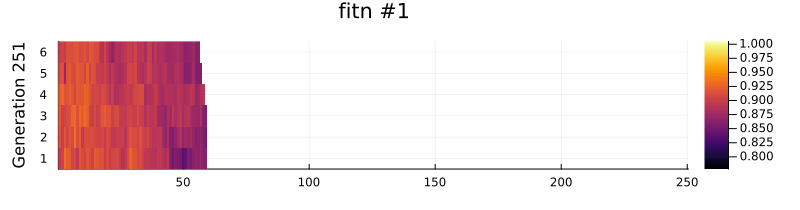

In [5]:
re_heatmap(aa, "fitn", aa["stats"]["n_gens"]-50, aa["stats"]["n_gens"],size=(800,210))

In [3]:
function timeseries_mean(ts, n_gens)
    return [mean(ts[i,:]) for i in 1:n_gens]
end

UndefVarError: UndefVarError: `aa` not defined

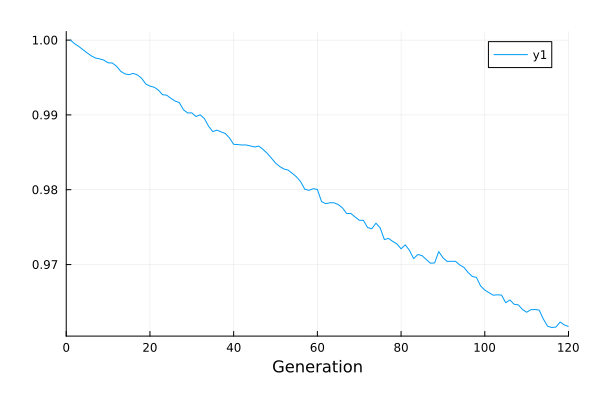

In [8]:
Plots.plot(re_fitnN_frontav_mean,xlabel="Generation",xlims=(0,120))

In [ ]:
Random.seed!(1234)
bb = rangeexp_1d_inf(1,200,1;x_max_burnin=5,x_max_exp=500,data_to_generate="FP",k_capacity=100,r_prolif_rate=2,weightfitn=false,condsel=true,name="2",mut_rate=0.05,migr_rate=0.05,s_sel_coef=0.005)

In [3]:
aa["stats"]

Dict{String, Any} with 18 entries:
  "wlddim"            => 1
  "r_prolif_rate"     => 2
  "max_burnin"        => (5,)
  "name"              => "1"
  "startfill"         => UnitRange{Int64}[1:5]
  "s_sel_coef"        => 0.009
  "n_gens_burnin"     => 5
  "k_capacity"        => 100
  "prop_of_del_muts"  => 0.9
  "migr_rate"         => 0.05
  "max"               => (10,)
  "n_segr_regions"    => 20
  "n_gens"            => 5
  "migr_mode"         => "ort"
  "n_gens_exp"        => 0
  "mut_rate"          => 12
  "max_exp"           => (10,)
  "n_demes_startfill" => 5

In [20]:
aa["fitn"]

500×201×1 Array{Float32, 3}:
[:, :, 1] =
   1.0    1.00005     0.999831  …    0.988876    0.98873     0.987096
   1.0    0.999545    0.999358       0.99109     0.990783    0.991313
   1.0    0.999802    0.999613       0.98985     0.990439    0.992244
   1.0    0.999911    0.999745       0.996143    0.997025    0.996408
   1.0    0.999811    0.999787       0.995514    0.994881    0.995446
 NaN    NaN           1.0       …    0.995098    0.994588    0.996362
 NaN    NaN         NaN              0.994435    0.992851    0.991983
 NaN    NaN         NaN              0.992116    0.991603    0.992392
 NaN    NaN         NaN              0.989953    0.99059     0.990901
 NaN    NaN         NaN              0.987854    0.988624    0.986509
   ⋮                            ⋱                            ⋮
 NaN    NaN         NaN            NaN         NaN         NaN
 NaN    NaN         NaN            NaN         NaN         NaN
 NaN    NaN         NaN            NaN         NaN         NaN
 NaN   

┌ Info: Saved animation to C:\Users\Hartree\AppData\Local\Temp\jl_1YHG9ahcHW.gif
└ @ Plots C:\Users\Hartree\.julia\packages\Plots\ju9dp\src\animation.jl:156


Plots.AnimatedGif("C:\\Users\\Hartree\\AppData\\Local\\Temp\\jl_1YHG9ahcHW.gif")
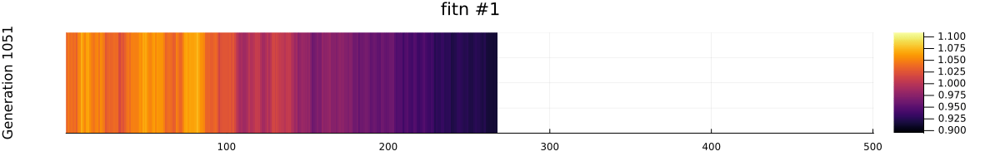

In [3]:
a = analyse(true)
b = analyse(false)
heatcheck(a[1])

┌ Info: Saved animation to C:\Users\Hartree\AppData\Local\Temp\jl_R2pmXi5YPk.gif
└ @ Plots C:\Users\Hartree\.julia\packages\Plots\ju9dp\src\animation.jl:156


Plots.AnimatedGif("C:\\Users\\Hartree\\AppData\\Local\\Temp\\jl_R2pmXi5YPk.gif")
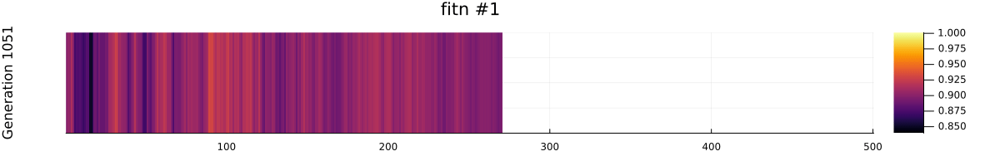

In [4]:
heatcheck(b[1])

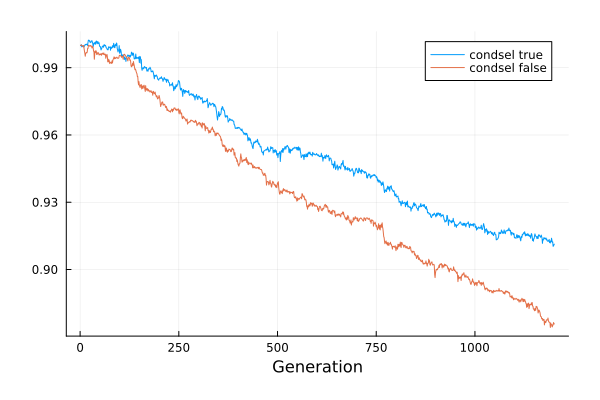

In [5]:
plotcheck(a,b)

In [9]:
heh_raw = Array{Float32}(undef,500,201,0)
for i in 1:1
    heh_raw = cat(heh_raw,deserialize("../../study/data/1d/1d_test_$i-meanf.dat");dims=3)
end
toNaN(x) = x < 0 ? NaN : x
#to3d(A) = reshape(A, size(A, 1), size(A, 2), 1)
heh_fitn = toNaN.(heh_raw) #|> to3d

500×201×1 Array{AbstractFloat, 3}:
[:, :, 1] =
   1.0    0.999607    0.999409  …    0.972879    0.970534    0.968639
   1.0    0.99969     0.999439       0.964188    0.963047    0.964092
   1.0    0.999775    0.999278       0.950224    0.947739    0.947655
   1.0    0.999526    0.999421       0.944984    0.943007    0.941051
   1.0    0.999536    0.999051       0.957081    0.956993    0.957848
 NaN    NaN         NaN         …    0.956546    0.956887    0.9543
 NaN    NaN         NaN              0.953716    0.950045    0.953913
 NaN    NaN         NaN              0.957585    0.955222    0.956635
 NaN    NaN         NaN              0.946207    0.94788     0.949195
 NaN    NaN         NaN              0.957248    0.954674    0.953941
   ⋮                            ⋱                            ⋮
 NaN    NaN         NaN            NaN         NaN         NaN
 NaN    NaN         NaN            NaN         NaN         NaN
 NaN    NaN         NaN            NaN         NaN         NaN
 Na

In [10]:
heh_fitn

500×201×1 Array{AbstractFloat, 3}:
[:, :, 1] =
   1.0    0.999607    0.999409  …    0.972879    0.970534    0.968639
   1.0    0.99969     0.999439       0.964188    0.963047    0.964092
   1.0    0.999775    0.999278       0.950224    0.947739    0.947655
   1.0    0.999526    0.999421       0.944984    0.943007    0.941051
   1.0    0.999536    0.999051       0.957081    0.956993    0.957848
 NaN    NaN         NaN         …    0.956546    0.956887    0.9543
 NaN    NaN         NaN              0.953716    0.950045    0.953913
 NaN    NaN         NaN              0.957585    0.955222    0.956635
 NaN    NaN         NaN              0.946207    0.94788     0.949195
 NaN    NaN         NaN              0.957248    0.954674    0.953941
   ⋮                            ⋱                            ⋮
 NaN    NaN         NaN            NaN         NaN         NaN
 NaN    NaN         NaN            NaN         NaN         NaN
 NaN    NaN         NaN            NaN         NaN         NaN
 Na

┌ Info: Saved animation to C:\Users\Hartree\AppData\Local\Temp\jl_sBazI5mFC5.gif
└ @ Plots C:\Users\Hartree\.julia\packages\Plots\ju9dp\src\animation.jl:156


Plots.AnimatedGif("C:\\Users\\Hartree\\AppData\\Local\\Temp\\jl_sBazI5mFC5.gif")
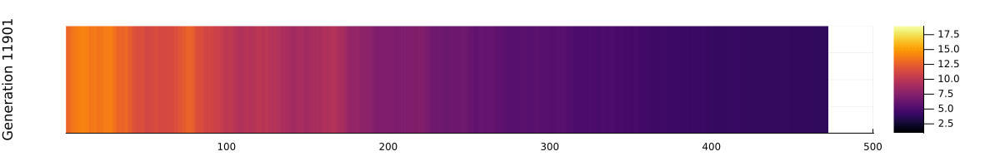

In [26]:
re_heatmap(heh_fitn[:,:,1],11900,12000)

In [39]:
N_GENS = 12000
N_GENS_BURNIN = 10000
X_MAX = 500
heh_fitn_frontav = average_front(heh_fitn,N_GENS,X_MAX;oneside=true)
heh_fitn_frontav_mean = timeseries_mean(heh_fitn_frontav, N_GENS)
heh_fitnN = norm_onset_mean(heh_fitn, N_GENS_BURNIN)
heh_fitnN_frontav = average_front(heh_fitnN, N_GENS, X_MAX; oneside=true)
heh_fitnN_frontav_mean = timeseries_mean(heh_fitnN_frontav, N_GENS)

12000-element Vector{Float32}:
 1.0
 0.99976325
 0.99936044
 0.99860466
 0.9980856
 0.9977799
 0.9973043
 0.99707055
 0.99628484
 0.9961932
 ⋮
 0.521328
 0.52115107
 0.52199054
 0.52104914
 0.5213679
 0.52153873
 0.5200221
 0.520241
 0.5205926

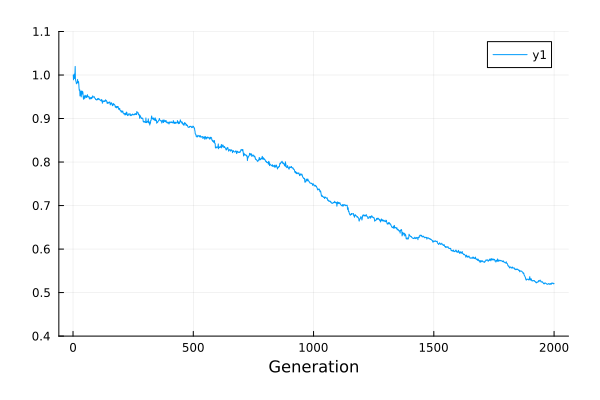

In [41]:
Plots.plot(heh_fitnN_frontav_mean[10001:12000],xlabel="Generation",ylims=(0.4,1.1))

In [15]:
re = rangeexp_1d_inf(1,120,1;x_max_burnin=5,x_max_exp=500,data_to_generate="F",k_capacity=100,r_prolif_rate=2,weightfitn=false,mut_rate=0.05,migr_rate=0.05,s_sel_coef=0.005)

Dict{String, Any} with 5 entries:
  "pops"  => NaN
  "del"   => NaN
  "fitn"  => Float32[1.0 0.999742 … 0.985756 0.985419; 1.0 0.999678 … 0.99237 0…
  "stats" => Dict{String, Any}("wlddim"=>1, "r_prolif_rate"=>2, "max_burnin"=>(…
  "ben"   => NaN

In [5]:
oneD1 = deserialize("data/2d_1.re")
oneD1_fitn_frontav = average_front(oneD1,"fitn";oneside=true)
oneD1_fitn_frontav_mean = timeseries_mean(oneD1_fitn_frontav, oneD1["stats"]["n_gens"])
oneD1_fitnN = norm_onset_mean(oneD1, "fitn")
oneD1_fitnN_frontav = average_front(oneD1_fitnN, oneD1["stats"]["n_gens"], oneD1["stats"]["max"]...; oneside=true)
oneD1_fitnN_frontav_mean = timeseries_mean(oneD1_fitnN_frontav, oneD1["stats"]["n_gens"])
oneD1nb = deserialize("data/2d_1nb.re")
oneD1nb_fitn_frontav = average_front(oneD1nb,"fitn";oneside=true)
oneD1nb_fitn_frontav_mean = timeseries_mean(oneD1nb_fitn_frontav, oneD1nb["stats"]["n_gens"])

1000-element Vector{Float32}:
 1.0
 0.99961936
 0.99932015
 0.9989408
 0.9985902
 0.9981235
 0.99764025
 0.9973957
 0.99689883
 0.9964115
 ⋮
 0.69623697
 0.6963835
 0.6956153
 0.6951021
 0.6944591
 0.69448674
 0.6942583
 0.69359624
 0.6932789

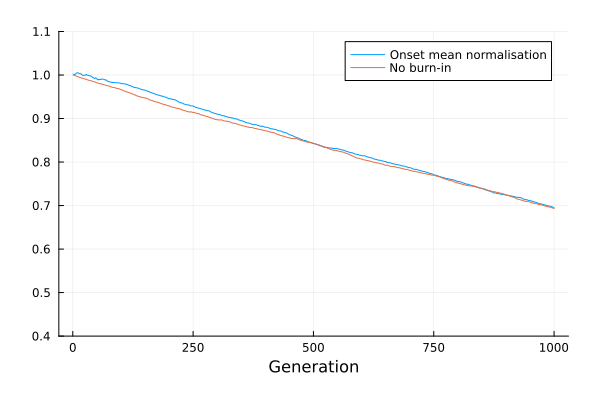

In [7]:
Plots.plot(oneD1_fitnN_frontav_mean[1001:2000],label="Onset mean normalisation",xlabel="Generation",ylims=(0.4,1.1))
Plots.plot!(oneD1nb_fitn_frontav_mean,label="No burn-in")

In [2]:
test = rangeexp_1d_inf(0,300,20;x_max_burnin=5,x_max_exp=500,data_to_generate="F",capacity=100,prolif_rate=2,mut_rate=0.05,migr_rate=0.05,sel_coef=0.005,weightfitn=false,condsel=true,oneside=true,premutate=true)

Dict{String, Any} with 5 entries:
  "pops"  => NaN
  "del"   => NaN
  "fitn"  => Float32[1.0 0.999593 … 0.951472 0.954648; 1.0 0.9995 … 0.948455 0.…
  "stats" => Dict{String, Any}("wlddim"=>1, "max_burnin"=>(5,), "name"=>"2024-0…
  "ben"   => NaN

In [5]:
test_fitn_frontav = average_front(test,"fitn";oneside=true)
test_fitn_frontav_mean = timeseries_mean(test_fitn_frontav, test["stats"]["n_gens"])
test_fitnN = norm_onset_mean(test, "fitn")
test_fitnN_frontav = average_front(test_fitnN, test["stats"]["n_gens"], test["stats"]["max"][1]; oneside=true)
test_fitnN_frontav_mean = timeseries_mean(test_fitnN_frontav, test["stats"]["n_gens"])

300-element Vector{Float32}:
 1.0
 0.99954796
 0.99902165
 0.99864024
 0.9976498
 0.99741554
 0.99684936
 0.9970232
 0.9967777
 0.996256
 ⋮
 0.9007408
 0.89923
 0.89918804
 0.898615
 0.8985041
 0.8994257
 0.897437
 0.897565
 0.896984

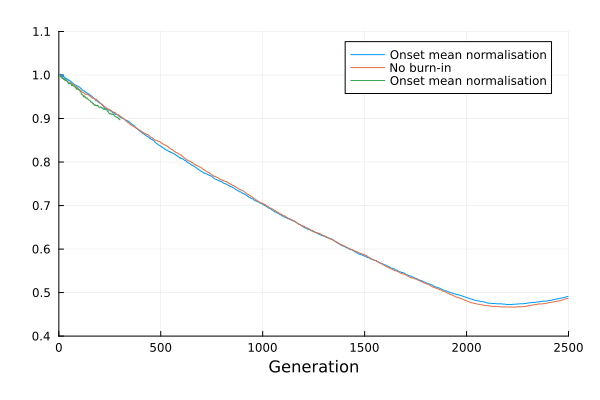

In [10]:
Plots.plot!(test_fitnN_frontav_mean,label="Onset mean normalisation",xlabel="Generation",ylims=(0.4,1.1),xlims=(0,2500))